In [1]:
import numpy as np
import cv2
import matplotlib.pyplot as plt
%matplotlib inline
import time

# Question 1

In [666]:
def gaussKernelGenerator(k, var):
    arr = []
    
    m = int(k/2)
    
    for i in range(k):
        arr.append(i-m)
    
    output = np.zeros([k,k], dtype = float)
    
    for i in range(k):
        for j in range(k):
            x = arr[i]
            y = arr[j]
            
            value = (-1)*(x**2+y**2)/(2*var)
            
            output[i][j] = np.exp(value)
    
    output = output/(2*var*3.14159)
    
    return output

In [664]:
def unsharpMasking(img,k,var):    
    row = img.shape[0]
    col = img.shape[1]
    
    (R,G,B) = cv2.split(img)
    
    m = int(k/2)
    
    ker = gaussKernelGenerator(k,var)
    ker = ker/np.sum(ker)
    
    out_img = np.zeros((row,col,3),dtype = int)
    
    for i in range(m,row-m):
        for j in range(m,col-m):
            out_img[i][j][0] = np.sum(R[i-m:i+m+1, j-m:j+m+1] * ker)
            out_img[i][j][1] = np.sum(G[i-m:i+m+1, j-m:j+m+1] * ker)
            out_img[i][j][2] = np.sum(B[i-m:i+m+1, j-m:j+m+1] * ker) 
    
    return img + (img - out_img)

In [665]:
def highBoost(img, k, coeff, var):
    row = img.shape[0]
    col = img.shape[1]
    
    (R,G,B) = cv2.split(img)
    
    m = int(k/2)
    
    ker = gaussKernelGenerator(k, var)
    ker = ker/np.sum(ker)
    
    out_img = np.zeros((row,col,3),dtype = int)
    
    for i in range(m,row-m):
        for j in range(m,col-m):
            out_img[i][j][0] = np.sum(R[i-m:i+m+1, j-m:j+m+1] * ker)
            out_img[i][j][1] = np.sum(G[i-m:i+m+1, j-m:j+m+1] * ker)
            out_img[i][j][2] = np.sum(B[i-m:i+m+1, j-m:j+m+1] * ker)             
    
    return img + coeff*(img - out_img)

In [659]:
img1 = cv2.imread('./Images/Jam.jpg')
img2 = cv2.imread('./Images/webb.jpg')

img1 = cv2.cvtColor(img1, cv2.COLOR_BGR2RGB);
img2 = cv2.cvtColor(img2, cv2.COLOR_BGR2RGB);

## part 1

In [469]:
k = 7
var = 6
res1 = unsharpMasking(img1, k, var)

In [490]:
k = 7
coeff = 4
var = 6
res2 = highBoost(img1, k, coeff, var)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


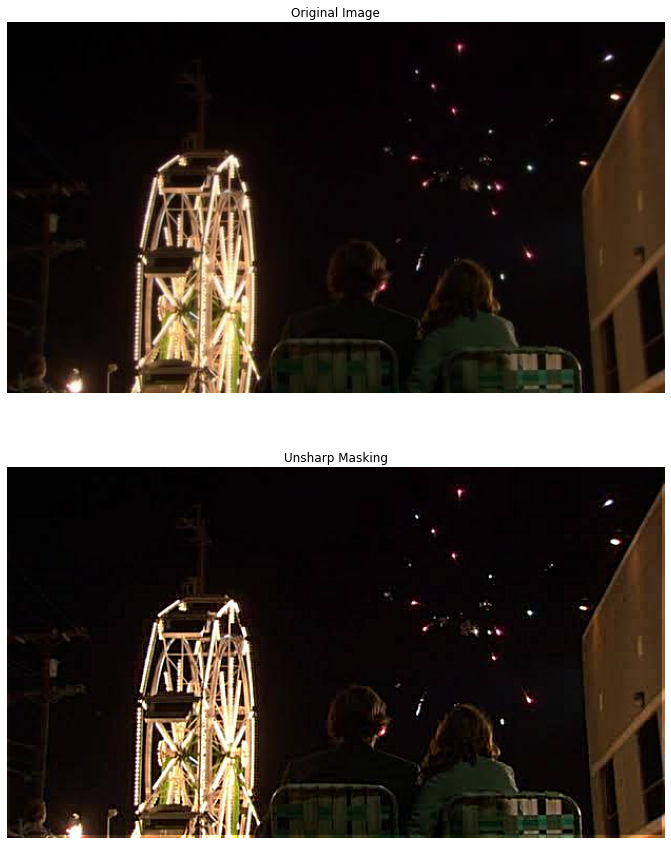

In [470]:
f = plt.figure()
f.set_figwidth(25)
f.set_figheight(15)

plt.subplot(211)
plt.axis("off")
plt.title("Original Image")
plt.imshow(img1, cmap = 'gray')

plt.subplot(212)
plt.axis('off')
plt.title("Unsharp Masking")
plt.imshow(res1, cmap = 'gray')

plt.show()

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


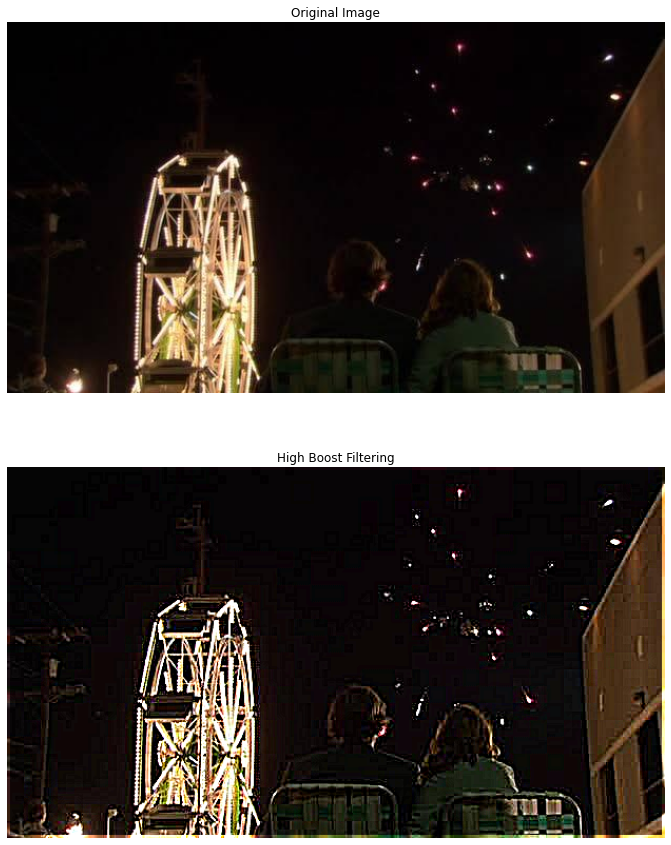

In [491]:
f = plt.figure()
f.set_figwidth(25)
f.set_figheight(15)

plt.subplot(211)
plt.axis("off")
plt.title("Original Image")
plt.imshow(img1, cmap = 'gray')

plt.subplot(212)
plt.axis("off")
plt.title("High Boost Filtering")
plt.imshow(res2, cmap = 'gray')

plt.show()

## part 2

In [660]:
k1 = 3
k2 = 7
k3 = 11

In [661]:
var = 6
res1 = unsharpMasking(img2, k1, var)
res2 = unsharpMasking(img2, k2, var)
res3 = unsharpMasking(img2, k3, var)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


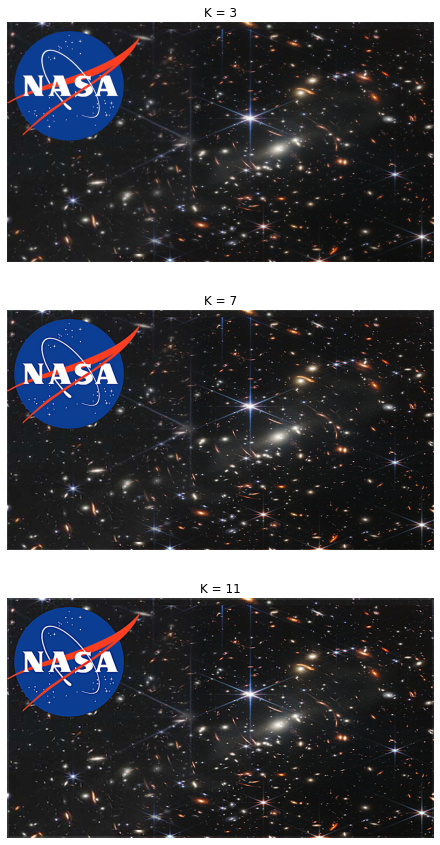

In [662]:
f = plt.figure()
f.set_figwidth(25)
f.set_figheight(15)

plt.subplot(311)
plt.axis("off")
plt.title("K = 3")
plt.imshow(res1, cmap = 'gray')

plt.subplot(312)
plt.axis("off")
plt.title("K = 7")
plt.imshow(res2, cmap = 'gray')

plt.subplot(313)
plt.axis("off")
plt.title("K = 11")
plt.imshow(res3, cmap = 'gray')

plt.show()

In [668]:
var = 6
coeff = 4
res1 = highBoost(img2, k1, coeff, var)
res2 = highBoost(img2, k2, coeff, var)
res3 = highBoost(img2, k3, coeff, var)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


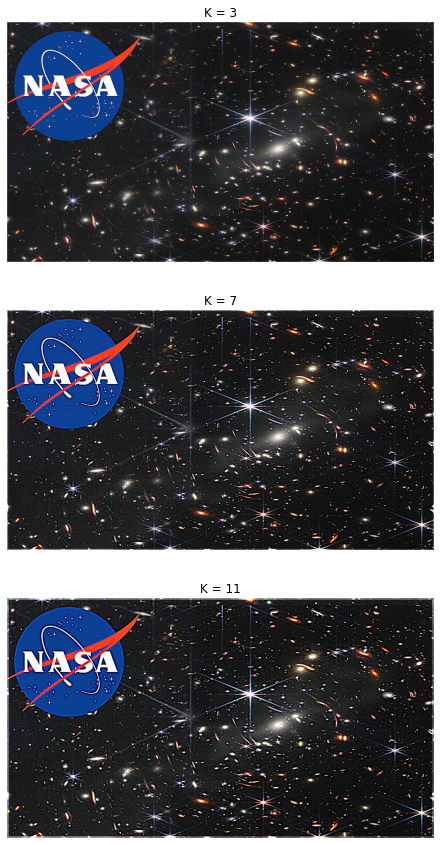

In [669]:
f = plt.figure()
f.set_figwidth(25)
f.set_figheight(15)

plt.subplot(311)
plt.axis("off")
plt.title("K = 3")
plt.imshow(res1, cmap = 'gray')

plt.subplot(312)
plt.axis("off")
plt.title("K = 7")
plt.imshow(res2, cmap = 'gray')

plt.subplot(313)
plt.axis("off")
plt.title("K = 11")
plt.imshow(res3, cmap = 'gray')

plt.show()

## Observations

#### From the above results we can observe that the sharping of image is more evident in high boost filter as compared to unsharp masking on changing the filter size, but in general we can see that image sharpness increases as we increase the filter size.

# Question 2

In [1006]:
def bilateralFilter(img,var1,var2,k):
    row = img.shape[0]
    col = img.shape[1]
    
    out_img = np.zeros(img.shape, dtype = int)
    
    m = int(k/2)
    
    #calculate the gaussian kernel
    Wc = gaussKernelGenerator(k,var1)

    for i in range(m, row -  m):
        for j in range(m, col - m):
            for l in range(3):
                temp = img[i-m:i+m+1, j-m:j+m+1, l:l+1]
                temp = temp.reshape(k,k)
                dist = (temp - img[i][j][l]*np.ones((k,k),dtype = int))**2/(2 * var2)
                Ws = np.exp(-dist)
                kernel = Ws*Wc
                kernel = kernel/np.sum(kernel)
                out_img[i][j][l] = np.sum(temp * kernel)
                
    return out_img

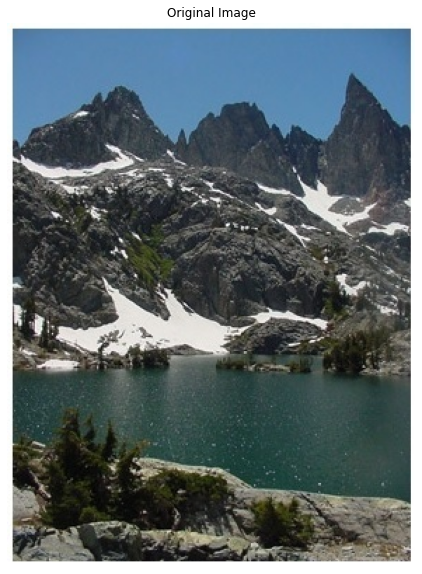

In [1007]:
img= cv2.imread('./Images/lakeside.jpg')
img1 = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

plt.figure()

plt.axis('off')
plt.title("Original Image")
plt.gcf().set_size_inches(10, 10)
plt.imshow(img1, cmap = 'gray')

plt.show()

In [1008]:
res = bilateralFilter(img1,225,2500,13)

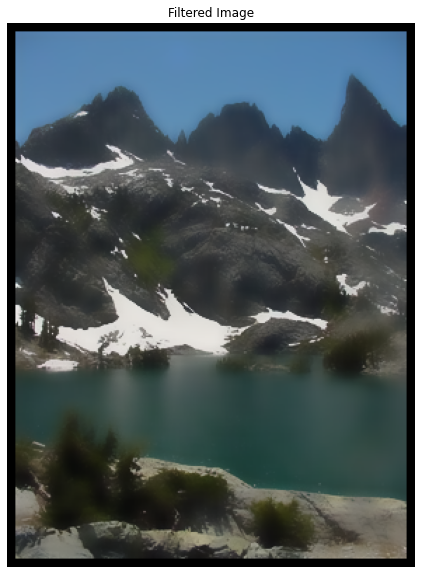

In [1009]:
plt.figure()

plt.axis('off')
plt.title("Filtered Image")
plt.gcf().set_size_inches(10, 10)
plt.imshow(res, cmap = 'gray')

plt.show()

In [1010]:
k_res1 = bilateralFilter(img1,225,2500,5)
k_res2 = bilateralFilter(img1,225,2500,7)
k_res3 = bilateralFilter(img1,225,2500,9)

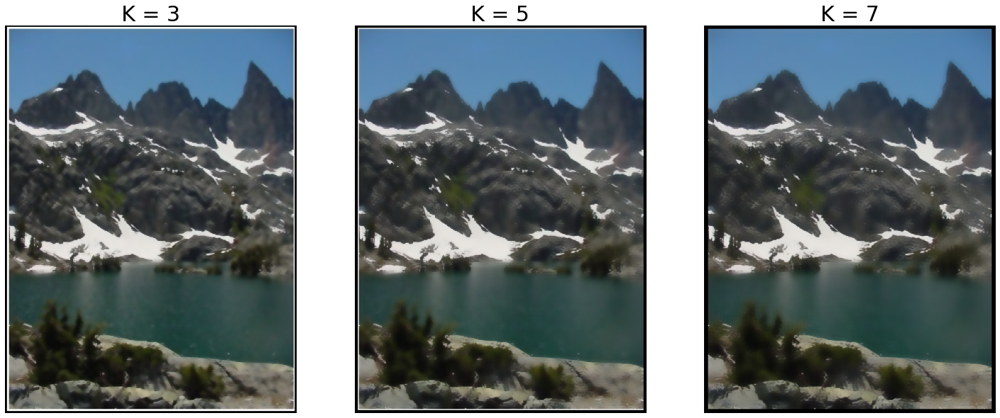

In [1011]:
f = plt.figure()
f.set_figwidth(25)
f.set_figheight(15)

plt.subplot(131)
plt.axis("off")
plt.title("K = 3", fontsize=30)
plt.imshow(k_res1, cmap = 'gray')

plt.subplot(132)
plt.axis("off")
plt.title("K = 5", fontsize=30)
plt.imshow(k_res2, cmap = 'gray')

plt.subplot(133)
plt.axis("off")
plt.title("K = 7", fontsize=30)
plt.imshow(k_res3, cmap = 'gray')

plt.show()

In [1012]:
s_res1 = bilateralFilter(img1,225,1600,7)
s_res2 = bilateralFilter(img1,225,2500,7)
s_res3 = bilateralFilter(img1,225,3600,7)

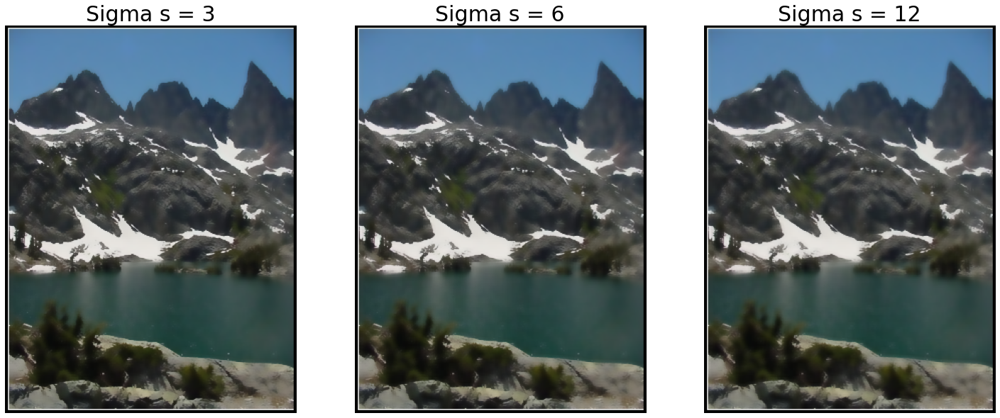

In [1013]:
f = plt.figure()
f.set_figwidth(25)
f.set_figheight(15)

plt.subplot(131)
plt.axis("off")
plt.title("Sigma s = 3", fontsize=30)
plt.imshow(s_res1, cmap = 'gray')

plt.subplot(132)
plt.axis("off")
plt.title("Sigma s = 6", fontsize=30)
plt.imshow(s_res2, cmap = 'gray')

plt.subplot(133)
plt.axis("off")
plt.title("Sigma s = 12", fontsize=30)
plt.imshow(s_res3, cmap = 'gray')

plt.show()

In [1014]:
c_res1 = bilateralFilter(img1,225,2500,7)
c_res2 = bilateralFilter(img1,400,2500,7)
c_res3 = bilateralFilter(img1,625,2500,7)

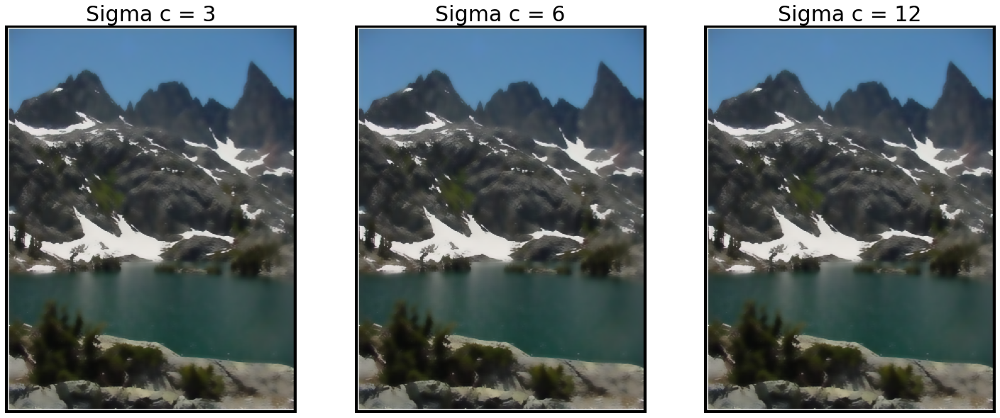

In [1015]:
f = plt.figure()
f.set_figwidth(25)
f.set_figheight(15)

plt.subplot(131)
plt.axis("off")
plt.title("Sigma c = 3", fontsize=30)
plt.imshow(c_res1, cmap = 'gray')

plt.subplot(132)
plt.axis("off")
plt.title("Sigma c = 6", fontsize=30)
plt.imshow(c_res2, cmap = 'gray')

plt.subplot(133)
plt.axis("off")
plt.title("Sigma c = 12", fontsize=30)
plt.imshow(c_res3, cmap = 'gray')

plt.show()

## Observations

#### Increasing the value of K results in larger smoothing as compared to other filters and thus it creates a frosty effect.
#### Increasing the value of Sigma c results in the smoothing of the image.
#### On Increasing the value of Sigma s, the edges become less evident.

# Question 3

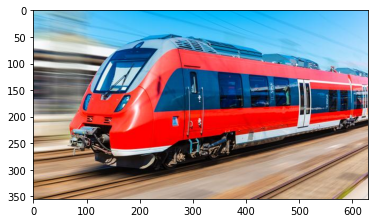

In [987]:
img = cv2.imread('./Images/train.jpg')
img1 = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

plt.imshow(img1, cmap = 'gray')

In [988]:
filtered_img = bilateralFilter(img1,10,10,3)

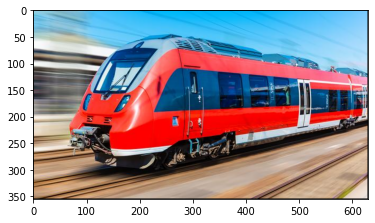

In [989]:
plt.imshow(filtered_img, cmap = 'gray')

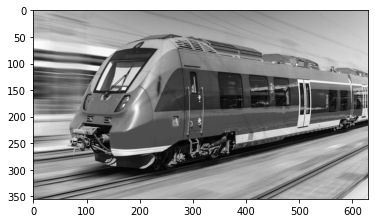

In [990]:
copy_img = img1
gray_img = cv2.cvtColor(copy_img, cv2.COLOR_RGB2GRAY)

plt.imshow(gray_img,cmap = 'gray')

In [991]:
def boxFilter(img,k):
    
    row = img.shape[0]
    col = img.shape[1]
    
    out_img = np.zeros([row,col], dtype = int)
    
    l = int(k/2)
    
    for i in range(l,row-l):
        sum=0
        for x in range(i-l,i+l+1):
            for y in range(0,k):
                sum += img[x][y]

        out_img[i][l] = int(sum/(k**2))
        
        for j in range(l+1,col-l):
            for x in range(i-l,i+l+1):
                sum -= img[x][j-l-1]
                
            for x in range(i-l,i+l+1):
                sum += img[x][j+l]
                
            out_img[i][j] = int(sum/(k**2))
            
    return out_img

In [992]:
def gaussianFilter(img, var, k):
    gauss_kernel = gaussKernelGenerator(k, var)
    
    s = np.sum(gauss_kernel)
    gauss_kernel = gauss_kernel/s
    
    row = img.shape[0]
    col = img.shape[1]
    
    m = int(k/2)
    
    out_img = np.zeros([row,col], dtype = int)
    
    for i in range(m,row-m):
        for j in range(m,col-m):
            val=0
            for x in range(i-m,i+m+1):
                for y in range(j-m,j+m+1):
                    val += img[x][y]*gauss_kernel[x-i][y-j]
                    
            out_img[i][j] = val
            
    return out_img

In [993]:
def adaptiveThreshold(img, k, const):
    row = img.shape[0]
    col = img.shape[1]
    
    out_img = np.zeros([row,col], dtype = int)
    
    l = int(k/2)
    
    for i in range(l,row-l):
        s=0
        for x in range(i-l,i+l+1):
            for y in range(0,k):
                s += img[x][y]

        if(img[i][l] > int(s/(k**2))-const):
                out_img[i][l] = 255
        
        for j in range(l+1,col-l):
            for x in range(i-l,i+l+1):
                s -= img[x][j-l-1]
                
            for x in range(i-l,i+l+1):
                s += img[x][j+l]
            
            if(img[i][j] > int(s/(k*k))-const):
                out_img[i][j] = 255
            
    return out_img

## Box fillter

In [994]:
blur_img = boxFilter(gray_img, 3)

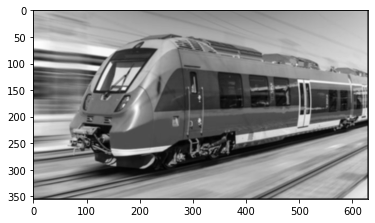

In [995]:
plt.imshow(blur_img, cmap = 'gray')

In [996]:
mask_img = adaptiveThreshold(blur_img, 5, 3)

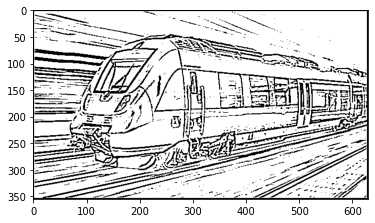

In [997]:
plt.imshow(mask_img, cmap = 'gray')

In [998]:
res = np.zeros(img.shape, dtype = int)

res_R = np.bitwise_and(mask_img,filtered_img[:,:,0])
res_G = np.bitwise_and(mask_img,filtered_img[:,:,1])
res_B = np.bitwise_and(mask_img,filtered_img[:,:,2])

res = np.dstack([res_R, res_G, res_B]);

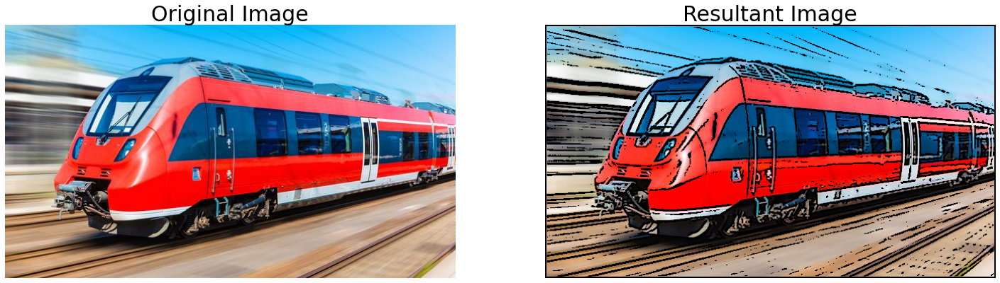

In [999]:
f = plt.figure()
f.set_figwidth(25)
f.set_figheight(15)

plt.subplot(121)
plt.axis("off")
plt.title("Original Image", fontsize=30)
plt.imshow(img1, cmap = 'gray')

plt.subplot(122)
plt.axis("off")
plt.title("Resultant Image", fontsize=30)
plt.imshow(res, cmap = 'gray')

plt.show()

## Gaussian filter

In [1000]:
blur_img = gaussianFilter(gray_img, 0.3, 3)

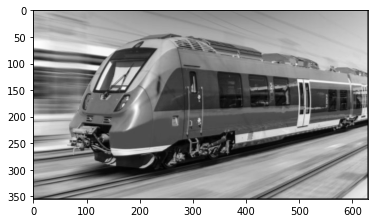

In [1001]:
plt.imshow(blur_img, cmap = 'gray')

In [1002]:
mask_img = adaptiveThreshold(blur_img, 5, 4)

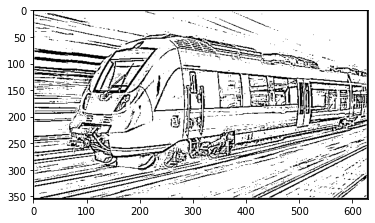

In [1003]:
plt.imshow(mask_img, cmap = 'gray')

In [1004]:
res = np.zeros(img.shape, dtype = int)

res_R = np.bitwise_and(mask_img,filtered_img[:,:,0])
res_G = np.bitwise_and(mask_img,filtered_img[:,:,1])
res_B = np.bitwise_and(mask_img,filtered_img[:,:,2])

res = np.dstack([res_R, res_G, res_B]);

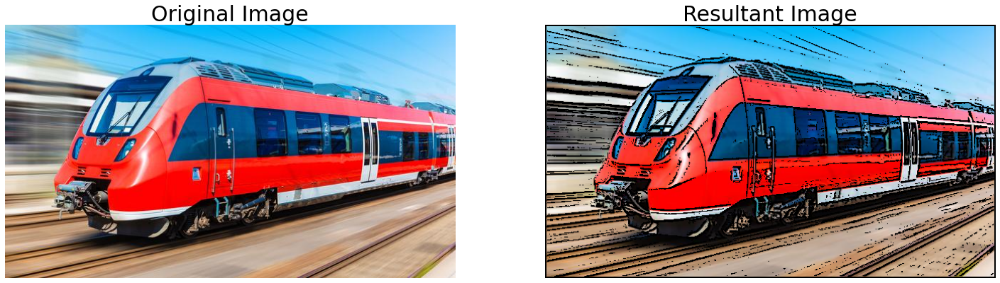

In [1005]:
f = plt.figure()
f.set_figwidth(25)
f.set_figheight(15)

plt.subplot(121)
plt.axis("off")
plt.title("Original Image", fontsize=30)
plt.imshow(img1, cmap = 'gray')

plt.subplot(122)
plt.axis("off")
plt.title("Resultant Image", fontsize=30)
plt.imshow(res, cmap = 'gray')

plt.show()

# Question 4

In [2]:
def dft_2d(img):
    row = img.shape[0]
    col = img.shape[1]
    
    temp = np.zeros((rows,cols), complex)
    out_img = np.zeros((rows,cols), complex)

    u = np.arange(row)
    v = np.arange(col)
    r = u.reshape((row,1))
    c = v.reshape((col,1))
    
    for x in range(row):
        a = 1j*np.sin(-2*np.pi*c*v/col) + np.cos(-2*np.pi*c*v/col)
        temp[x] = np.dot(a, im[x])
  
    for y in range (col):
        b = 1j*np.sin(-2*np.pi*r*u/row) + np.cos(-2*np.pi*r*u/row)
        out_img[:,col] = np.dot(b, temp[:,col])
  
    return out_img

In [3]:
def dft_1D(img):
    img = np.asarray(img, dtype = complex)
    row = img.shape[0]
    out_img = img.copy()

    for x in range(row):
        u = x
        s = complex(0,0)
        for y in range(row):
            v = y
            s += img[v]*np.exp(-2j*np.pi*v*u*1/row)
    
        out_img[u] = s

    return out_img

In [4]:
def fft_1D(img):
    img = np.asarray(img, dtype = complex)
    row = img.shape[0]
    size = 4

    if(row <= size):
        return dft_1D(img)
    else:
        img_even = fft_1D(img[0::2])
        img_odd = fft_1D(img[1::2])
        
        comp = np.exp(-2j*np.pi*np.arange(row)/row)

        c1 = img_even + img_odd * comp[:int(row/2)]
        c2 = img_even + img_odd * comp[int(row/2):]

        out_img = np.concatenate([c1, c2])

    return out_img

In [5]:
def fft_2D(img):
    row = img.shape[0]
    col = img.shape[1]

    out_img = np.zeros(img.shape, dtype = complex)

    for i in range(row):
        out_img[i,:] = fft_1D(img[i,:])

    for i in range(col):
        out_img[:,i] = fft_1D(out_img[:,i])
            
    return out_img

In [6]:
def ifft_1D(img):
    img = np.asarray(img, dtype = complex)
    img_conj = np.conjugate(img)

    out_img = fft_1D(img_conj)

    out_img = np.conjugate(out_img)
    out_img = out_img / img.shape[0]
    
    return out_img

In [7]:
def ifft_2D(img):
    row = img.shape[0]
    col = img.shape[1]
    
    out_img = np.zeros(img.shape, dtype = complex)

    for i in range(row):
        out_img[i,:] = ifft_1D(img[i,:])

    for i in range(col):
        out_img[:,i] = ifft_1D(out_img[:,i])

    out_img = np.abs(out_img)
    out_img = (255*out_img)/np.max(out_img)
    
    return out_img

In [8]:
img1 = cv2.imread('./Images/strips.png',0)

img1 = cv2.resize(img1,(256,256))

## part 1

In [858]:
sizes = [4,8,16,32,64,128,256,512]

dft_time = []
fft_time = []

for sz in range(len(sizes)):
    img = img1.copy()
    img =  cv2.resize(img,(sizes[sz],sizes[sz]))
    start = time.time()
    t1 = dft_2D(img)
    end = time.time()
    
    dft_time.append(end-start)
    
    start = time.time()
    t1 = fft_2D(img)
    end = time.time()
    
    fft_time.append(end-start)

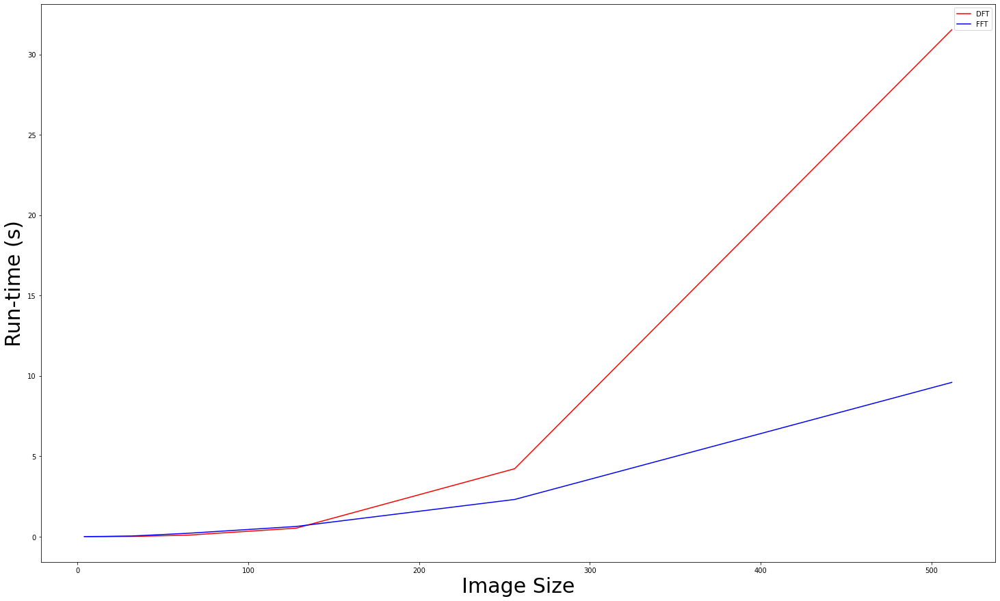

In [864]:
f = plt.figure()
f.set_figwidth(25)
f.set_figheight(15)

plt.plot(sizes,dft_time,'r',label = 'DFT')
plt.plot(sizes,fft_time,'b',label = 'FFT')  
plt.xlabel('Image Size', fontsize=30)
plt.ylabel('Run-time (s)', fontsize=30)
plt.legend()

plt.show()

## part 2

In [9]:
img_fft = fft_2D(img1)

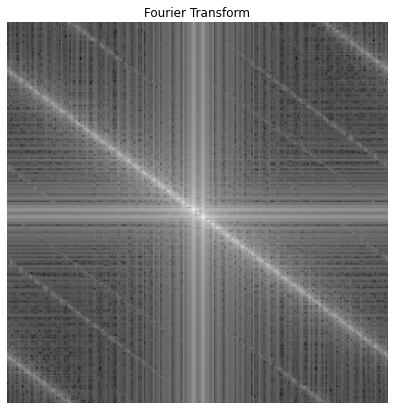

In [10]:
f = plt.figure()
f.set_figwidth(7)
f.set_figheight(7)

plt.axis("off")
plt.title("Fourier Transform")
plt.imshow(np.log(1+np.abs(np.fft.fftshift(img_fft))), cmap = 'gray')

plt.show()

In [45]:
res = ifft_2D(img_fft)
res = res.astype(int)

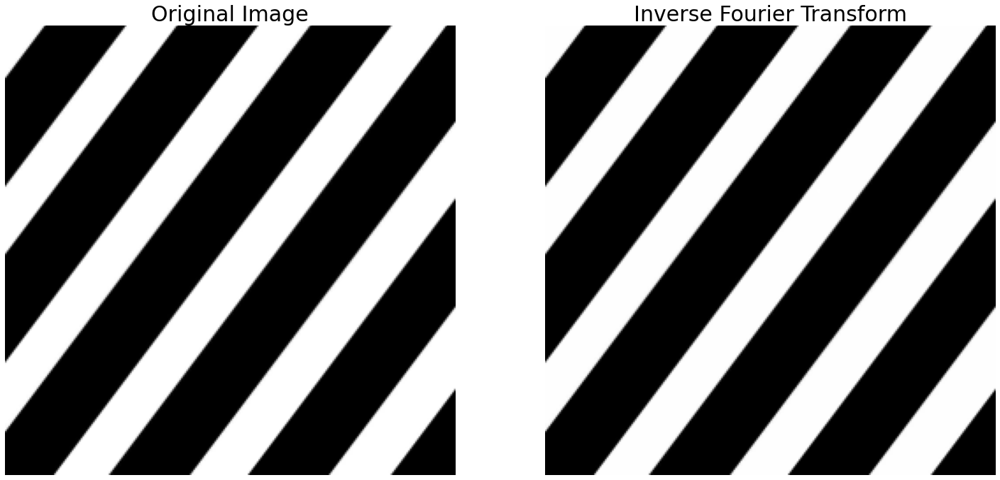

In [48]:
f = plt.figure()
f.set_figwidth(25)
f.set_figheight(15)

plt.subplot(121)
plt.axis("off")
plt.title("Original Image", fontsize=30)
plt.imshow(img1, cmap = 'gray')

plt.subplot(122)
plt.axis("off")
plt.title("Inverse Fourier Transform", fontsize=30)
plt.imshow(res, cmap = 'gray')

plt.show()

In [11]:
res2 = fft_2D(img_fft)

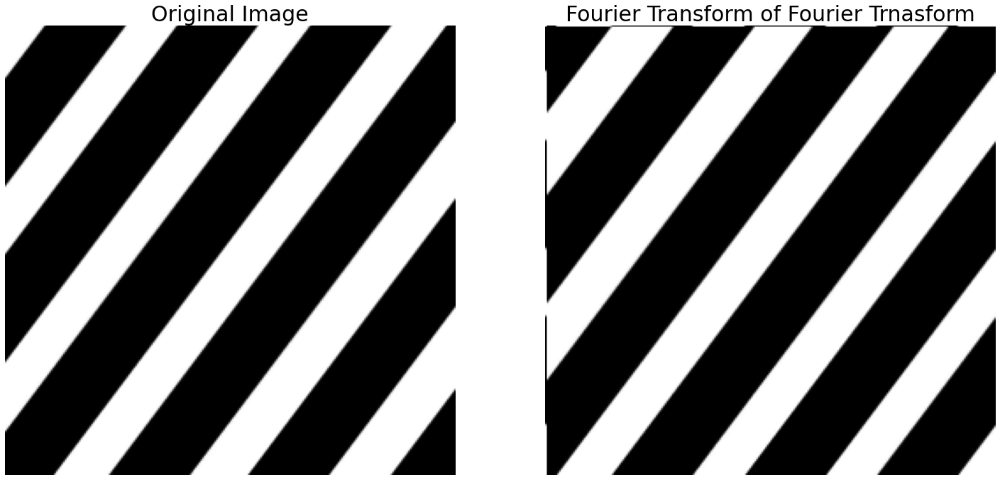

In [22]:
f = plt.figure()
f.set_figwidth(25)
f.set_figheight(15)

plt.subplot(121)
plt.axis("off")
plt.title("Original Image", fontsize=30)
plt.imshow(img1, cmap = 'gray')

plt.subplot(122)
plt.axis("off")
plt.title("Fourier Transform of Fourier Trnasform", fontsize=30)
plt.imshow(np.abs(res2), cmap = 'gray')

plt.show()

## Observation

#### Fourier Transform gives the information about the frequency domain of the image while original image gives the spatial information of the image.
#### Fourier transform assumes that there are multiple copies of the images in all the directions, so the fourier transform starts from the center of the left image and goes up to center of the right image therefore fourier transform of fourier transform got diagonally flipped as shown above. Thats why we take the conjugate of the image resulting in the shifting of its center and hence we obtain the origial image after applying the inverse function.

# Question 5

In [8]:
def lpf(img , D):
    temp = np.zeros(img.shape, dtype = int)
    r = int(img.shape[0]/2)
    c = int(img.shape[1]/2)
    
    for i in range(img.shape[0]):
        for j in range(img.shape[1]):
            if ((abs(i-r))**2 + (abs(j-c))**2 <= D*D):
                temp[i][j] = 1
  
    out_img = temp*img
    return out_img

In [9]:
def gpf(img , D):
    temp = np.zeros(img.shape, dtype = float)
    r = int(img.shape[0]/2)
    c = int(img.shape[1]/2)
    
    for i in range(img.shape[0]):
        for j in range(img.shape[1]):
            dist = (abs(i-r))**2 + (abs(j-c))**2
            exp = dist/(2*D*D)
            temp[i][j] = np.exp((-1*exp))
  
    out_img = img*temp
    
    return out_img

In [973]:
img1 = cv2.imread('./Images/lakeside.jpg',0)
img1 = cv2.resize(img1,(256,256))

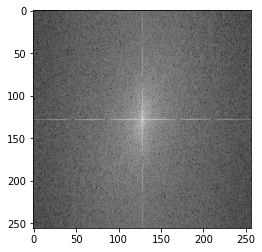

In [974]:
img_fft = fft_2D(img1)

plt.imshow(np.log(1+np.abs(np.fft.fftshift(img_fft))), cmap = 'gray');

In [975]:
img_lpf1 = lpf(np.fft.fftshift(img_fft),30)
img_lpf2 = lpf(np.fft.fftshift(img_fft),15)
img_lpf3 = lpf(np.fft.fftshift(img_fft),50)

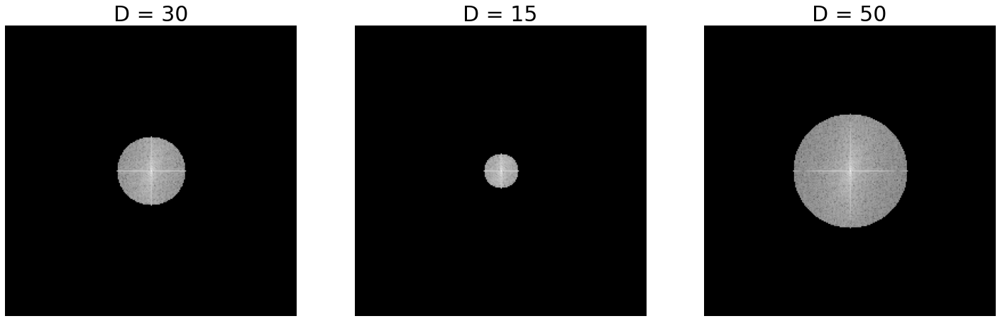

In [979]:
f = plt.figure()
f.set_figwidth(25)
f.set_figheight(15)

plt.subplot(131)
plt.axis("off")
plt.title("D = 30", fontsize=30)
plt.imshow(np.log(1+np.abs(img_lpf1)), cmap = 'gray')

plt.subplot(132)
plt.axis("off")
plt.title("D = 15", fontsize=30)
plt.imshow(np.log(1+np.abs(img_lpf2)), cmap = 'gray')

plt.subplot(133)
plt.axis("off")
plt.title("D = 50",fontsize=30)
plt.imshow(np.log(1+np.abs(img_lpf3)), cmap = 'gray')

plt.show()

In [980]:
res1 = ifft_2D(img_lpf1)
res2 = ifft_2D(img_lpf2)
res3 = ifft_2D(img_lpf3)

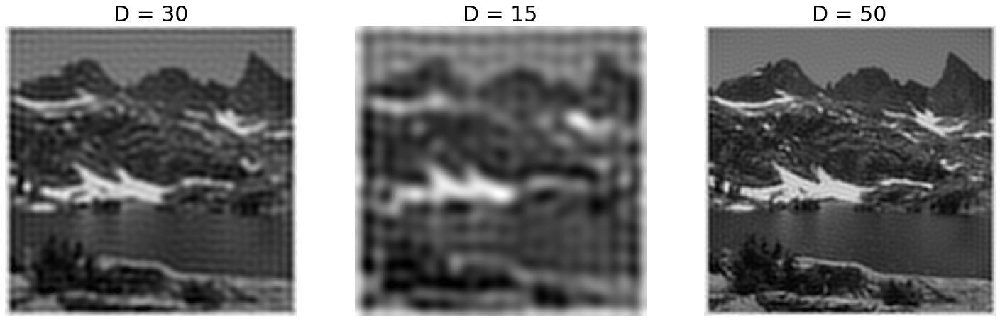

In [983]:
f = plt.figure()
f.set_figwidth(25)
f.set_figheight(15)

plt.subplot(131)
plt.axis("off")
plt.title("D = 30", fontsize=30)
plt.imshow(res1, cmap = 'gray')

plt.subplot(132)
plt.axis("off")
plt.title("D = 15", fontsize=30)
plt.imshow(res2, cmap = 'gray')

plt.subplot(133)
plt.axis("off")
plt.title("D = 50", fontsize=30)
plt.imshow(res3, cmap = 'gray')

plt.show()

In [380]:
img_gpf1 = gpf(np.fft.fftshift(img_fft),30)
img_gpf2 = gpf(np.fft.fftshift(img_fft),15)
img_gpf3 = gpf(np.fft.fftshift(img_fft),50)

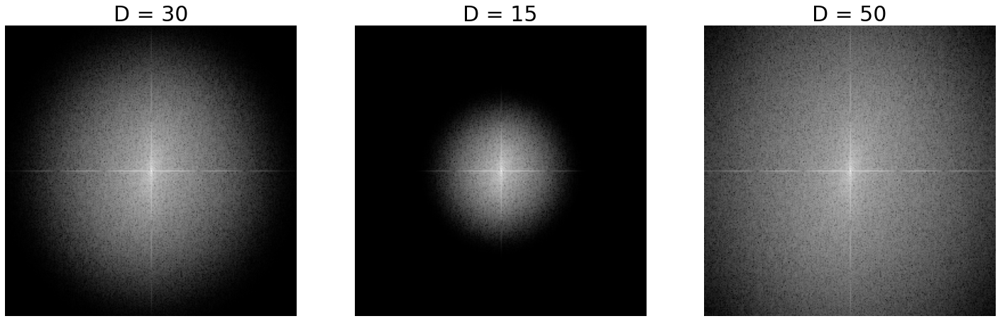

In [984]:
f = plt.figure()
f.set_figwidth(25)
f.set_figheight(15)

plt.subplot(131)
plt.axis("off")
plt.title("D = 30", fontsize=30)
plt.imshow(np.log(1+np.abs(img_gpf1)), cmap = 'gray')

plt.subplot(132)
plt.axis("off")
plt.title("D = 15", fontsize=30)
plt.imshow(np.log(1+np.abs(img_gpf2)), cmap = 'gray')

plt.subplot(133)
plt.axis("off")
plt.title("D = 50", fontsize=30)
plt.imshow(np.log(1+np.abs(img_gpf3)), cmap = 'gray')

plt.show()

In [985]:
res1 = ifft_2D(img_gpf1)
res1 = res1.astype(int)
res2 = ifft_2D(img_gpf2)
res2 = res2.astype(int)
res3 = ifft_2D(img_gpf3)
res3 = res3.astype(int)

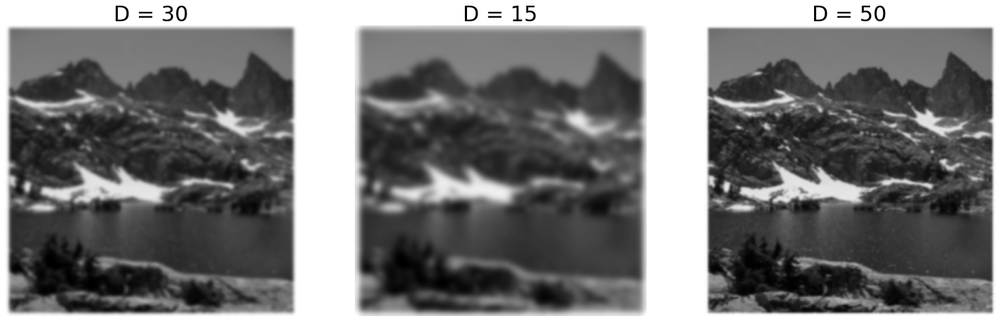

In [986]:
f = plt.figure()
f.set_figwidth(25)
f.set_figheight(15)

plt.subplot(131)
plt.axis("off")
plt.title("D = 30", fontsize=30)
plt.imshow(res1, cmap = 'gray')

plt.subplot(132)
plt.axis("off")
plt.title("D = 15", fontsize=30)
plt.imshow(res2, cmap = 'gray')

plt.subplot(133)
plt.axis("off")
plt.title("D = 50", fontsize=30)
plt.imshow(res3, cmap = 'gray')

plt.show()

## Observations

#### Increasing D will result in more smoothing of the image in both the filters.
#### An Ideal low pass filter cuts of the frequency suddenly thus because of that smoothing effect is not very prominent whereas on the other hand in gaussian low pass filter the frequency weightage decreases in a more smoother way.

# Question 6

In [19]:
img = cv2.imread('./Images/cart.jpg')
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB);

img = cv2.resize(img, (256,256))

In [20]:
def powerLawTransform(img,c,gamma):
    img = img/255
    
    row = img.shape[0]
    col = img.shape[1]
    
    output_img = np.zeros([row,col], dtype = object)
    
    for i in range(row):
        for j in range(col):
            output_img[i][j] = c*np.power(img[i][j],gamma)
    
    output_img = output_img*255
    
    return output_img.astype(int)

In [21]:
fft_imgR = fft_2D(img[:,:,0])
fft_imgG = fft_2D(img[:,:,1])
fft_imgB = fft_2D(img[:,:,2])

In [35]:
filter_imgR = gpf(np.fft.fftshift(fft_imgR),50)
filter_imgG = gpf(np.fft.fftshift(fft_imgG),50)
filter_imgB = gpf(np.fft.fftshift(fft_imgB),50)

In [36]:
ifft_imgR = ifft_2D(filter_imgR)
ifft_imgR = ifft_imgR.astype(int)

ifft_imgG = ifft_2D(filter_imgG)
ifft_imgG = ifft_imgG.astype(int)

ifft_imgB = ifft_2D(filter_imgB)
ifft_imgB = ifft_imgB.astype(int)

In [38]:
res1 = powerLawTransform(ifft_imgR, 1, 2)
res2 = powerLawTransform(ifft_imgG, 1, 2)
res3 = powerLawTransform(ifft_imgB, 1, 2)

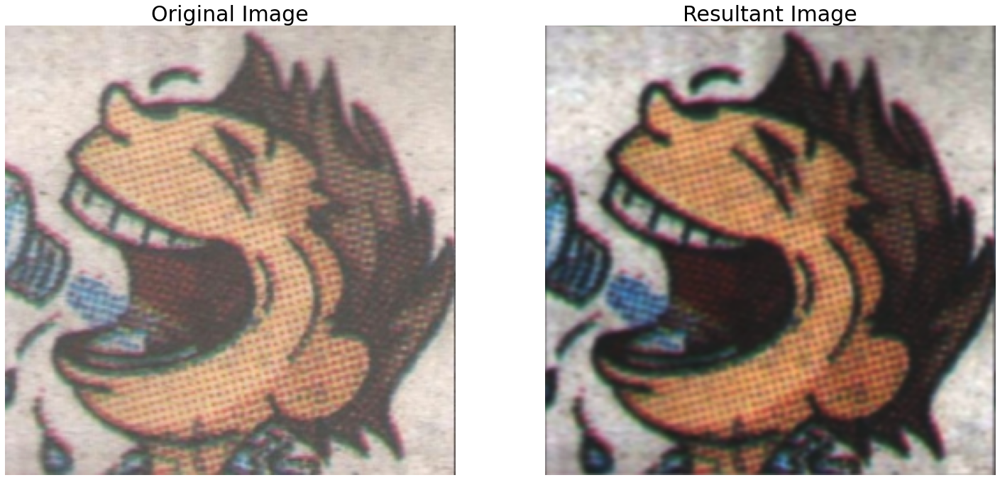

In [40]:
f = plt.figure()
f.set_figwidth(25)
f.set_figheight(15)

plt.subplot(121)
plt.axis("off")
plt.title("Original Image", fontsize=30)
plt.imshow(img, cmap = 'gray')

plt.subplot(122)
plt.axis("off")
plt.title("Resultant Image", fontsize=30)
plt.imshow(np.dstack([res1, res2, res3]), cmap = 'gray')

plt.show()